# BIOS 29326 Demo 1: Playing with Images in Python
*By Amy Renne with special thanks to Gia Jadick for teaching me image processing basics through her extremely helpful document, "Pydicom Tutorial" <3*
* We learned in lecture this week that digital images are at their most basic form, a big matrix of numbers
* This means we have an object of discrete numbers mapped to specific locations in space
* Conveniently, we can manipulate such an object mathematically and achieve lots of cool results! 

## 1) Getting Started

### The Data
* For this tutorial, we will investigate radiograph datasets from our clinic of various xray QA phantoms (non-human objects used for image quality measurements)
* If you didn't clone this project directly, you can download the data from the``Week 1/data`` directory in the Gitlab repository: [https://gitlab.phy.anl.gov/arenne/bios29326-physics-of-medical-imaging/-/tree/main/Week%201/data ]
* Make sure to change the variable ``ROOT`` in code block [1] to your local directory where you downloaded the data!
* Each image is of a DICOM data type
* DICOMs contain all the information you might want to know about an image including not just the pixel-value matrix (the actual image), but also all infrormation about how the image was obtained (xray machine settings)
### Useful Python Packages in Image Processing
- Python offers many different image analysis and mathematic packages 
- Here I include the ones I've found most helpful but there are many more to play around with
- **PyDicom** is excellent for dealing with DICOM data structures (if dealing with basic .jpeg or .png images, see **OpenCV** documenation here: [https://pypi.org/project/opencv-python/])
- **MatPlotLib** is a great plotting package
- **NumPy** and **SciPy** are some of the best math packages expecially when dealing with array (matrix) data types
- **NOTE:** Conda comes preloaded with many of the packages listed, however, you will probably need to install pydicom in order to compile the folowing imports block. To do so, open a terminal input the following code: ``conda install -c conda-forge pydicom``

In [1]:
# IMPORTS 
import os
import pydicom 
import matplotlib.pyplot as plt 
import numpy as np
import scipy
from scipy import signal

# DATA PATH
# define system path to the image data (multiple images in this directory)
# CHANGE THIS PATH to your local project directory where you downloaded the data!
ROOT = '/Users/rennedev/Documents/projects/0_THESIS/classes/MPHY386_imaging1/labs/lab1/data/' # CHANGE ME

## 2) Plotting an Image

- First, the boring part: *How do we load an image into an object that python can handle?*
- Let's read in a dataset and explore what we have to play with!

---------------------------------
Number of images in directory: 18
---------------------------------
Pixel Representation of Image:

[[4996 4849 4646 ... 5457 5516 5211]
 [4936 4952 4897 ... 5574 5351 5347]
 [4949 4884 4809 ... 5272 5480 5416]
 ...
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]]
---------------------------------
Plot Representation of Image:


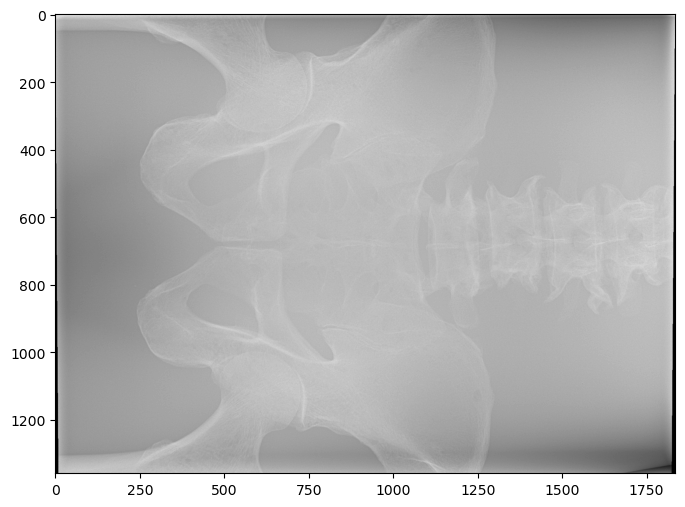

In [2]:
# READ DATA
# read in the data and get a list of files 
img_list = sorted(os.listdir(ROOT)) 

# print the number of images we have to play with
print('---------------------------------')
print('Number of images in directory: %s'%(len(img_list)))

# read the first image 
i = 0
dicom = pydicom.dcmread(ROOT+img_list[i]) 

# convert the DICOM object to a pixel array to plot
pixels = dicom.pixel_array # this is the IMAGE object we can work with!
print('---------------------------------')
print('Pixel Representation of Image:')
print('')
print(pixels)
print('---------------------------------')
print('Plot Representation of Image:')

# plot the first radiograph!
fig,ax = plt.subplots(1,1,figsize=[8,6]) 
ax.imshow(pixels, cmap='gray') 

- Yay we plotted our first image! 
- These matrix values represent the absorbed xray energy on a film screen after passing through the phantom
- Dark pixels correspond to high energy deposition in the film (low object attenuation)
- Light pixels correspond to low energy deposition in the film (high object attenuation)
- Thus, radiography images are *negative* images
- **From a huge matrix of seemingly random numbers, we now have a meaningfull image giving insight into an object's physical structure!**

**IMPORTANT!** 
- The direction of **the Y axis in an image matrix is flipped** from conventional plots 
- This is just because of the way matrix objects are defined in Python 
- The Y axis values *decrease* as you *move up* the image
- This can be confusing when trying to opperating on image matricies, so take note!

## 3) Exploring DICOM Information

- Now that we know how to plot an image, what else can we learn about it?
- DICOMs store important information about the image aquisition that we can access through keys
- First, lets see all the keys that are available to us:

In [3]:
# print all keys in the DICOM 
print(dicom.dir())

['AccessionNumber', 'AcquisitionContextSequence', 'AcquisitionDate', 'AcquisitionDateTime', 'AcquisitionDeviceProcessingDescription', 'AcquisitionTime', 'AnatomicRegionSequence', 'BitsAllocated', 'BitsStored', 'BodyPartExamined', 'BurnedInAnnotation', 'CollimatorShape', 'Columns', 'CommentsOnRadiationDose', 'ContentDate', 'ContentTime', 'DetectorActiveDimensions', 'DetectorActiveShape', 'DetectorBinning', 'DetectorConditionsNominalFlag', 'DetectorConfiguration', 'DetectorElementPhysicalSize', 'DetectorElementSpacing', 'DetectorID', 'DetectorTemperature', 'DetectorType', 'DeviationIndex', 'DistanceSourceToDetector', 'DistanceSourceToPatient', 'EntranceDose', 'EntranceDoseInmGy', 'Exposure', 'ExposureControlMode', 'ExposureControlModeDescription', 'ExposureIndex', 'ExposureInuAs', 'ExposureTime', 'FieldOfViewDimensions', 'FieldOfViewHorizontalFlip', 'FieldOfViewOrigin', 'FieldOfViewRotation', 'FieldOfViewShape', 'FilterMaterial', 'FilterThicknessMaximum', 'FilterThicknessMinimum', 'Filte

- Wow, that's a lot of keys!
- Let's just choose a few important ones to describe our image
- In radiography, we generally care about the following parameters as they directly relate to image quality and patient dose:
    - Xray tube voltage setting (kVp)
    - Xray tube current (mA)
    - Pixel intensity relationship scaling type (log or linear)

Text(0.5, 1.0, 'Z01: 1835 x 1358 pixels, 75 kVp, 499 mA, LOG scaled')

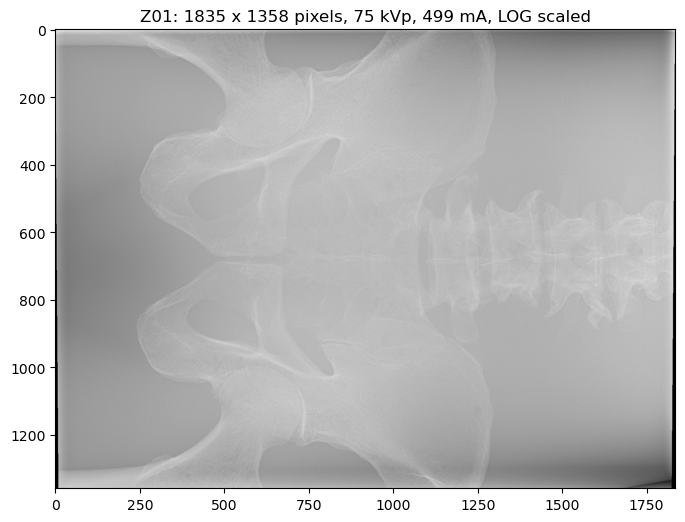

In [4]:
# extract some key DICOM information 
rows, cols = dicom.Rows, dicom.Columns      # image dimensions 
kVp = int(dicom.KVP)                        # xray tube voltage
mA = dicom.XRayTubeCurrent                  # xray tube current
pir = dicom.PixelIntensityRelationship      # log or linear scaling

# plot the first image and include Dicom info in the figure title
fig,ax = plt.subplots(1,1,figsize=[8,6]) 
ax.imshow(pixels, cmap='gray') 
ax.set_title('%s: %s x %s pixels, %s kVp, %s mA, %s scaled'%(img_list[i], cols, rows, kVp, mA, pir)) 

- Nice! Now we have a plotted image along with a descriptive title telling use about how it was obtained
- A few more boring pieces, then we'll get to the good part (promise ^_^)

## 4) Exploring More Images

- We've investigated the first image nicely
- Now we want to see what other images we have to play with 
- We can plot all images in our ``ROOT`` home directory at once using a convenient for loop:
### Plotting All Images

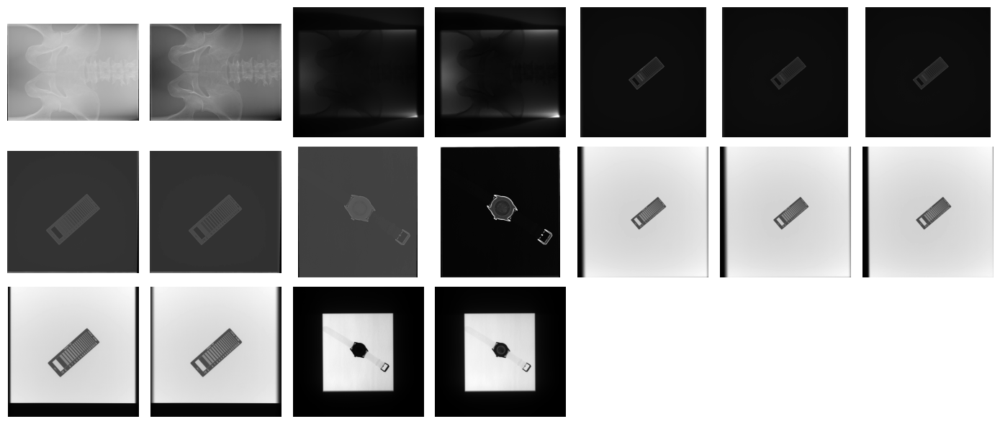

In [5]:
# Might take a minute to compile - be patient your machine is working very hard <3
yd, xd = 3,7 
fig,ax = plt.subplots(yd,xd,figsize=[xd*2, yd*2]) 
for i in range(len(img_list)): 
    ds = pydicom.dcmread(ROOT+img_list[i]) 
    ax[i//xd, i%xd].imshow(ds.pixel_array, cmap='gray') 
    for i in range(xd*yd): # turn off axes so images look nicer 
        ax[i//xd, i%xd].axis('off')
fig.tight_layout() 

- We now see all of the images contained in our dataset!
- Let's make a little function to easily load a pixel array of a specific image:
### Pixel Loading Function

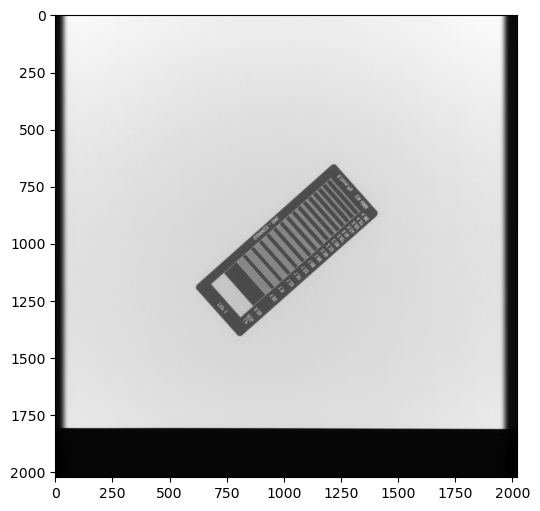

In [6]:
def get_pixels(i, ROOT, img_list):
    '''A function to convert a Dicom dataset 
        to a pixel array ready for plotting. 
        Change i to select a specific dataset.'''
    dicom = pydicom.dcmread(ROOT+img_list[i]) 
    img = dicom.pixel_array 
    return(img)

# test this fucntion on image 14 
pixels = get_pixels(14, ROOT, img_list)

# plot
fig,ax = plt.subplots(1,1,figsize=[8,6]) 
ax.imshow(pixels, cmap='gray') 

- Cool! Now we can call ``get_pixels()`` any time we want to play with a specific image by referencing the index number of the image in the directory (0-17)
- We just plotted image 14, a radiograph of a QA phantom used to measure resolution 
- This image is kind of tiny though :(
- Let's zoom in through index slicing

## 5) Cropping Images

- Python objects can be "indexed" (sliced) to deal with small parts of a large object easily
- When you have a matrix $M$, you can slice it up by using **brackets** after the matrix with the following syntax:

\begin{equation}
M[a:b, i:j] \rightarrow \text{rows $a$ through $b$, columns $i$ through $j$}
\end{equation}

- In plain english, this means: 
\begin{equation}
M[\text{rows wanted (y range)}, \text{cols wanted (x range)}]
\end{equation}

**Python Indexing Rules to Remember:**
- Python matricies are defined by [rows, cols], not the traditional mathematics definition we are used to [cols,rows]
- **Semicolons** are used to deliniate ranges for both rows and columns
- A **comma** is used to deliniate row slices from column slices
- Use : by itself to select **everything** in a row or col
- Use $a$: to select everything **after and including** $a$ in a row or col
- Use :$z$ to select everything **before and upto** $z$ in a row or col 

Let's explore these rules with the following croping examples using image 14:
### Cropping Columns (X-Range)

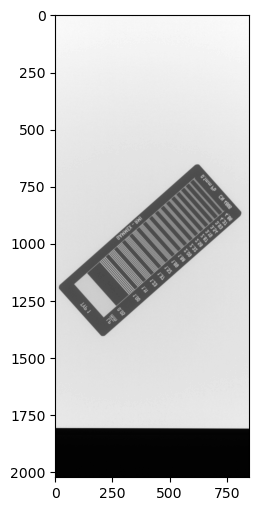

In [7]:
# load image pixels
pixels = get_pixels(14, ROOT, img_list)

# crop pixels -> all rows and only columns 600-1450
cropped_pixels = pixels[:,600:1450]

# plot
fig,ax = plt.subplots(1,1,figsize=[8,6]) 
ax.imshow(cropped_pixels, cmap='gray') 

### Cropping Rows (Y-Range)

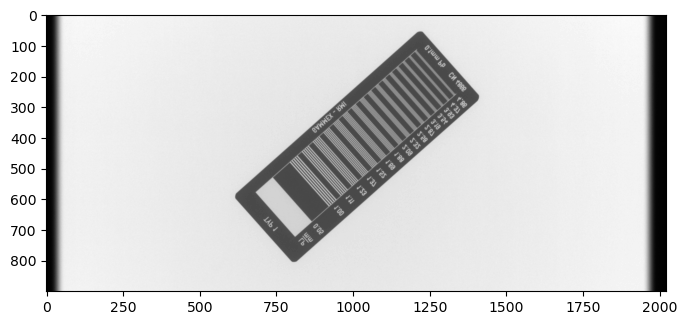

In [8]:
# crop pixels -> only rows 600-1500 and all columns
cropped_pixels = pixels[600:1500,:]

# plot
fig,ax = plt.subplots(1,1,figsize=[8,6]) 
ax.imshow(cropped_pixels, cmap='gray') 

### Cropping Columns and Rows

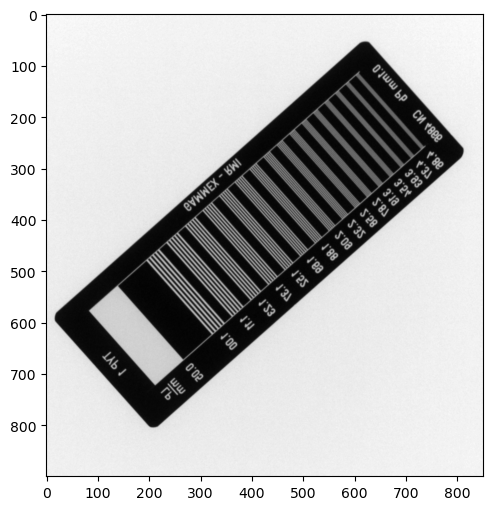

In [9]:
# crop pixels -> only rows 600-1500 and only columns 600-1450
cropped_pixels = pixels[600:1500,600:1450]

# plot
fig,ax = plt.subplots(1,1,figsize=[8,6]) 
ax.imshow(cropped_pixels, cmap='gray') 

- That's better!
- Note that the image looks much more contrasted now
- This is because **the grey scale has adjusted to scale to the min/max of the available *cropped* pixels instead of the whole image**
- An important point is that the *numerical value* of these pixels remains the same, while the *image representation* of these values change due to color map scaling 
- Hang on, it looks like this image is reversed! Let's fix that using a NumPy function ``fliplr``:
### Inverting an Image

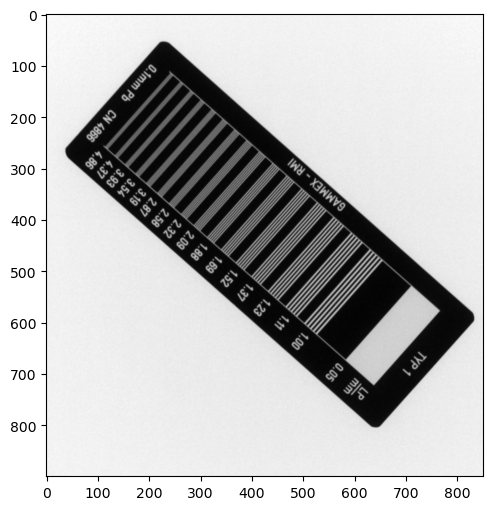

In [10]:
# invert
flipped_pixels = np.fliplr(cropped_pixels)

# plot
fig,ax = plt.subplots(1,1,figsize=[8,6]) 
ax.imshow(flipped_pixels, cmap='gray') 

- You've finally made it past the boring part!
- You now know how to read, load, crop, and invert an image :)
- Let's get to the good stuff, convolution and fourier transforms

## 6) Opperating on Images: Convolutions as Filters

- When abstract concepts like convolution is taught from a mathematic perspective, they can be fairly confusing!
- When demonstrated through applications like image analysis, these things become much less scary (and really cool!)
- For a great introduction to Convolution, see [ https://betterexplained.com/articles/intuitive-convolution/ ]
- Let's experiment by using SciPy's convolving function ``convolve2D`` to convolve some cool filtering kernels with an image

### A) Gaussian Convolution: Blurring

- We are all familiar with the beloved gaussian function, but here is the 2D formulation in case you forgot:
\begin{equation}
f(x,y) = \frac{1}{2\pi\sigma^2} \exp \left(\frac{(x-\mu_x)^2+(y-\mu_y)^2}{2\sigma^2}\right)
\end{equation}
- How do we turn this continueous function into a discrete convolution kernel?
- We can plot this function on a 2D grid to get the familiar 3D gaussian shape
- If we project back down to 2D with a contor plot, we arrive at the motivation for the discrete gaussian kernel:

#### Continuous 2D Gaussian Function

/var/folders/wm/m5znc76d365d_16vvb85vzcr0000gn/T/ipykernel_81039/1547263145.py:4: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark')


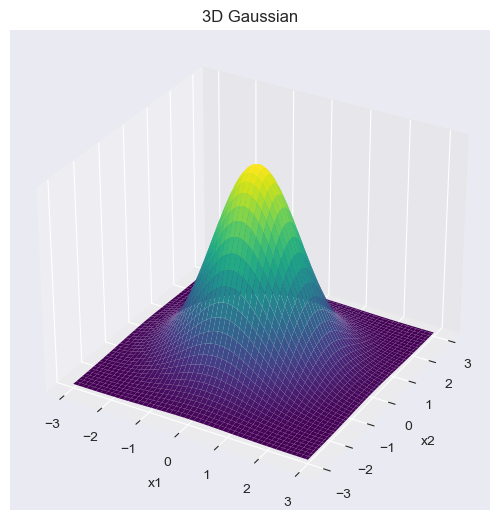

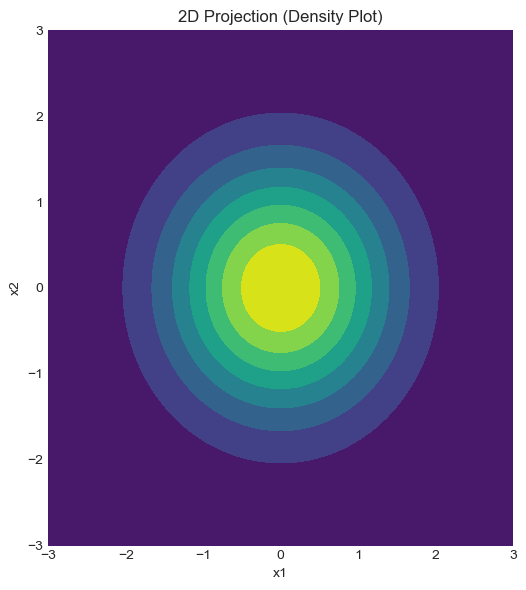

In [11]:
# GAUSSIAN KERNEL MOTIVATION
# Don't waste time trying to understand this messy code, its just for proving a point!
from scipy.stats import multivariate_normal
plt.style.use('seaborn-dark')
plt.rcParams['figure.figsize']=15,6
fig = plt.figure()
random_seed=1000
cov_val = [0]
mean = np.array([0,0])
pdf_list = []
for idx, val in enumerate(cov_val):
    cov = np.array([[1, val], [val, 1]])
    distr = multivariate_normal(cov = cov, mean = mean,seed = random_seed)
    mean_1, mean_2 = mean[0], mean[1]
    sigma_1, sigma_2 = cov[0,0], cov[1,1]
    x = np.linspace(-3*sigma_1, 3*sigma_1, num=100)
    y = np.linspace(-3*sigma_2, 3*sigma_2, num=100)
    X, Y = np.meshgrid(x,y)
    pdf = np.zeros(X.shape)
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            pdf[i,j] = distr.pdf([X[i,j], Y[i,j]])
    key = 131+idx
    ax = fig.add_subplot(key, projection = '3d')
    ax.plot_surface(X, Y, pdf, cmap = 'viridis')
    plt.xlabel("x1")
    plt.ylabel("x2")
    plt.title('3D Gaussian')
    pdf_list.append(pdf)
    ax.axes.zaxis.set_ticks([])
plt.tight_layout()
plt.show()
for idx, val in enumerate(pdf_list):
    plt.subplot(1,3,idx+1)
    plt.contourf(X, Y, val, cmap='viridis')
    plt.xlabel("x1")
    plt.ylabel("x2")
    plt.title('2D Projection (Density Plot)')
plt.tight_layout()
plt.show()

- This is a beautiful projection, but it is a continuous function while image pixels are always discrete!
- We need to model this continuous gaussian projection as a discrete matrix (kernel)
- Let's plot two of the most common gaussian kernels:

#### The Kernel

Text(0.5, 1.0, 'Gaussian Blur 5x5')

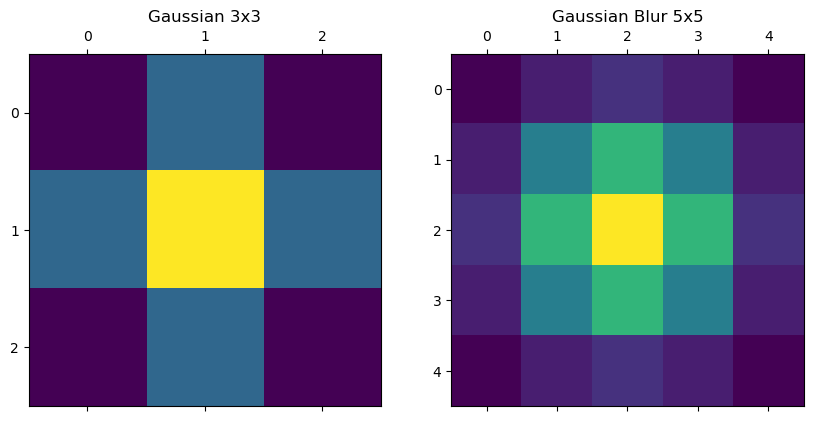

In [12]:
# define kernel(s)
gaussian_blur_3x3 = np.array([
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1]
]) / 16

gaussian_blur_5x5 = np.array([
    [1, 4, 6, 4, 1],
    [4, 16, 24, 16, 4],
    [6, 24, 36, 24, 6],
    [4, 16, 24, 16, 4],
    [1, 4, 6, 4, 1]
]) / 256

# plot
plt.style.use('default')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))
ax1.matshow(gaussian_blur_3x3)
ax1.set_title('Gaussian 3x3')
#ax1.set_axis_off()
ax2.matshow(gaussian_blur_5x5)
ax2.set_title('Gaussian Blur 5x5')
#ax2.set_axis_off()

- All these kernels do is "pixelize" the continuous gaussian shown above
- We now have discrete gaussian kernels we can use for convolution!
- Let's convolve a croppped image 14 with each gaussian kernel using SciPy ``convolve2D``
- NOTE: You can hard code a 2D convolution function manually if you want a slightly annoying coding challenge, but realistically using a package function like ``convolve2D`` is way more efficient :P
- For info on how to properly use ``convole2D`` see the documentation here: [ https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.convolve2d.html ]

#### The Convolution

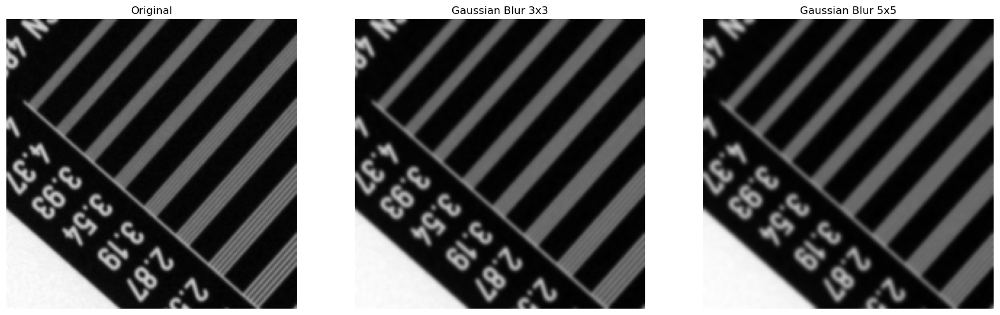

In [13]:
# load, crop, flip, and zoom image 14
pixels = get_pixels(14, ROOT, img_list)
pixels = np.fliplr(pixels[600:1500,600:1450])[200:400, 100:300]
#zoom_pixels = pixels[200:400, 100:300]

# do convolution
convolution1 = signal.convolve2d(pixels, gaussian_blur_3x3, boundary='symm', mode='same')
convolution2 = signal.convolve2d(pixels, gaussian_blur_5x5, boundary='symm', mode='same')

# plot comparison
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 20))
# original image
ax1.imshow(pixels, cmap='gray')
ax1.set_title('Original')
ax1.set_axis_off()
# convolved image
ax2.imshow(np.absolute(convolution1), cmap='gray')
ax2.set_title('Gaussian Blur 3x3')
ax2.set_axis_off()
# convolved image
ax3.imshow(np.absolute(convolution2), cmap='gray')
ax3.set_title('Gaussian Blur 5x5')
ax3.set_axis_off()

- Wow, that's a lot of blur!
- We can see that the 5x5 matrix causes more blurring than the 3x3
- This is because a convolution takes a weighted average of the pixels it covers as it shifts along every pixel of the image
- A large kernel will result in a stronger averaging effect, leading to more blur
- We often use blurring convolutions to decrease noise and improve SNR for low signal imaging such as flouroscopy 

### B) High Pass Filter: Sharpening

#### The Kernel

Text(0.5, 1.0, 'Gaussian Blur')

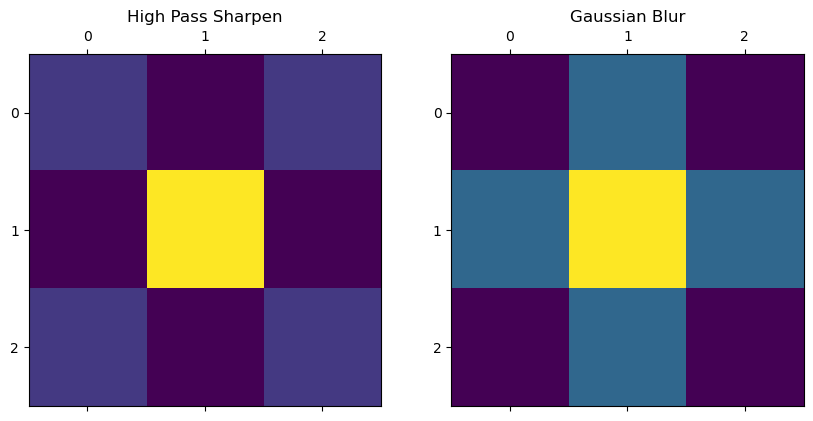

In [14]:
# define kernel
sharpen = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
]) 
# plot
plt.style.use('default')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))
ax1.matshow(sharpen)
ax1.set_title('High Pass Sharpen')
ax2.matshow(gaussian_blur_3x3)
ax2.set_title('Gaussian Blur')

- A sharpening kernel is just the opposite of a gaussian kernel!

#### The Convolution

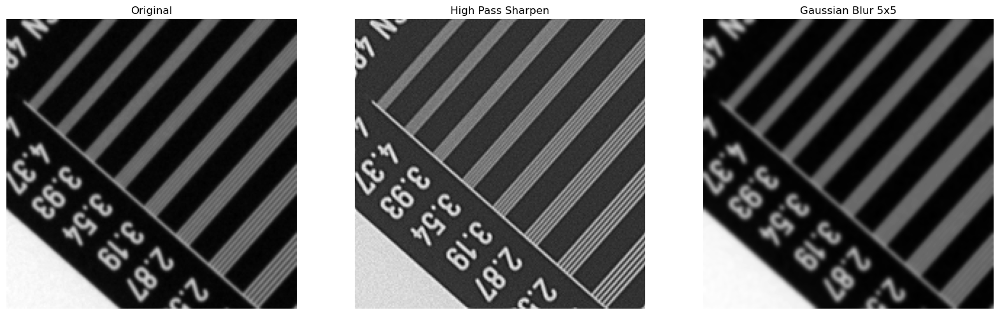

In [15]:
# load, crop, flip and zoom image 14
pixels = get_pixels(14, ROOT, img_list)
pixels = np.fliplr(pixels[600:1500,600:1450])[200:400, 100:300]

# do convolution
convolution1 = signal.convolve2d(pixels, sharpen, boundary='symm', mode='same')
convolution2 = signal.convolve2d(pixels, gaussian_blur_5x5, boundary='symm', mode='same')

# plot comparison
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 20))
# original image
ax1.imshow(pixels, cmap='gray')
ax1.set_title('Original')
ax1.set_axis_off()
# convolved image
ax2.imshow(np.absolute(convolution1), cmap='gray')
ax2.set_title('High Pass Sharpen')
ax2.set_axis_off()
# convolved image
ax3.imshow(np.absolute(convolution2), cmap='gray')
ax3.set_title('Gaussian Blur 5x5')
ax3.set_axis_off()

#### Example with Image 0

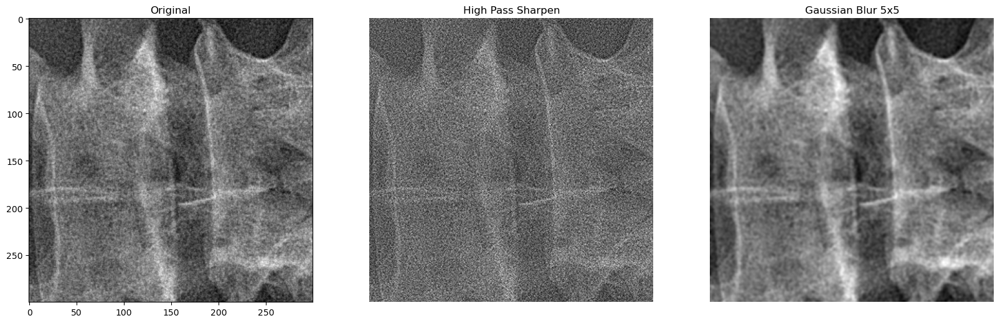

In [16]:
# load and crop image 0
pixels = get_pixels(0, ROOT, img_list)[500:800, 1100:1400]

# do convolution
convolution1 = signal.convolve2d(pixels, sharpen, boundary='symm', mode='same')
convolution2 = signal.convolve2d(pixels, gaussian_blur_5x5, boundary='symm', mode='same')

# plot comparison
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 20))
# original image
ax1.imshow(pixels, cmap='gray')
ax1.set_title('Original')
#ax1.set_axis_off()
# convolved image
ax2.imshow(np.absolute(convolution1), cmap='gray')
ax2.set_title('High Pass Sharpen')
ax2.set_axis_off()
# convolved image
ax3.imshow(np.absolute(convolution2), cmap='gray')
ax3.set_title('Gaussian Blur 5x5')
ax3.set_axis_off()

### C) Complex Scharr Convolution: Edge Detection

- The Complex Scharr kernel calculates gradients between neighboring pixels in both x and y directions
- Since a gradient is by definition a vector and thus contains both magnitude (real) and direction (imaginary) components, we can learn useful things about the relationships between pixel values in a spatial context
- This kernel is very useful for edge detection!

#### The Kernel

In [17]:
# define kernel
scharr = np.array([[ -3-3j, 0-10j,  +3 -3j],
                   [-10+0j, 0+ 0j, +10 +0j],
                   [ -3+3j, 0+10j,  +3 +3j]]) 

- Sadly, we can't plot this because it is a complex valued matrix
- We could plot just the real part of the kernel, but this is misleading as there's way more going on
- We can still use it for convolution!

#### The Convolution

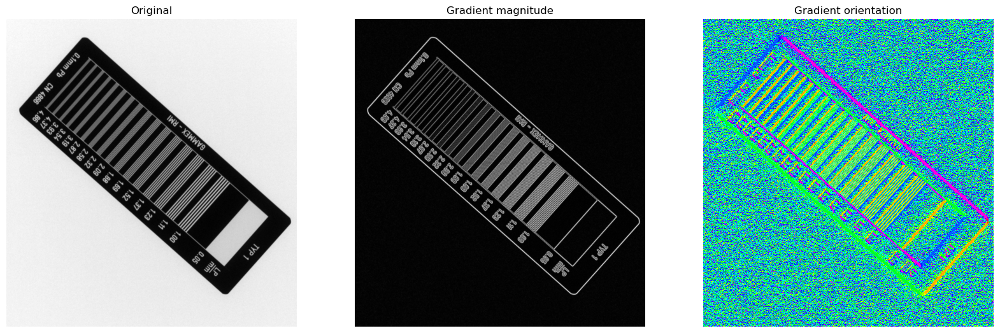

In [18]:
# load, crop and flip image 14
pixels = get_pixels(14, ROOT, img_list)
pixels = np.fliplr(pixels[600:1500,600:1450])

# do the convolution
convolution1 = signal.convolve2d(flipped_pixels, scharr, boundary='symm', mode='same')

# plot
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 20))
ax1.imshow(flipped_pixels, cmap='gray')
ax1.set_title('Original')
ax1.set_axis_off()
ax2.imshow(np.absolute(convolution1), cmap='gray')
ax2.set_title('Gradient magnitude')
ax2.set_axis_off()
ax3.imshow(np.angle(convolution1), cmap='hsv') 
ax3.set_title('Gradient orientation')
ax3.set_axis_off()

- The magnitude part of the convolution (real part) shows the absolute difference between neighboring pixel values
- The orientation part of the convolution (complex part) shows the difference in vector orientation of neighboring pixel values 
- Both of these outcomes can be useful for edge detection depending on the image

#### Example with Tricky Edges

- That was fun, but you might be wondering why we would need such a filter when the human eye could already clearly define where the edges of this image are!
- Let's try the same kernel with a different image where the edges are not so obvious such as image 3:

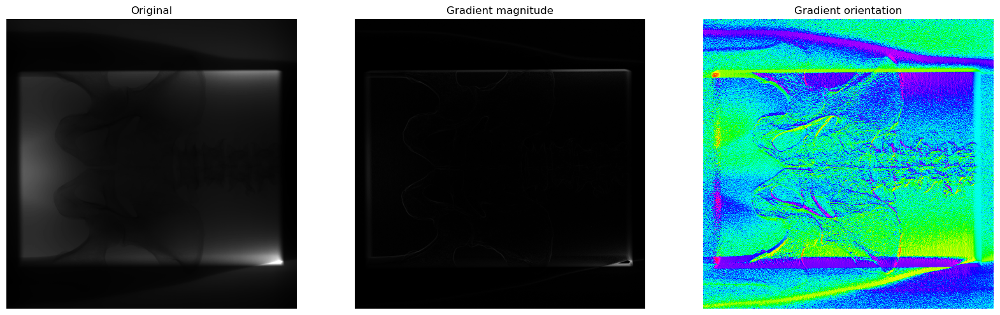

In [19]:
# load image 3
pixels = get_pixels(3, ROOT, img_list)

# do the convolution
convolution1 = signal.convolve2d(pixels, scharr, boundary='symm', mode='same')

# plot
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 20))
ax1.imshow(pixels, cmap='gray')
ax1.set_title('Original')
ax1.set_axis_off()
ax2.imshow(np.absolute(convolution1), cmap='gray')
ax2.set_title('Gradient magnitude')
ax2.set_axis_off()
ax3.imshow(np.angle(convolution1), cmap='hsv') 
ax3.set_title('Gradient orientation')
ax3.set_axis_off()

- Wow! Convolution with the Scharr kernel allows us to see remarkable structural detail from an image that was drastically underexposed
- This is one small example of the power of convolution in imaging!

## 7) Transforming Images: Fourier Transforms

### FT Theory

- This section is intended to be a *very* quick refresher on FT theory to motivate the following image processing examples
- A following notebook will go into more details on theory! 
- If none of this looks familiar or you need a refresher on some specific topic, check out these reviews:
    - FT quick review: [ https://mriquestions.com/fourier-transform-ft.html ]
    - 1DFT overview: [ https://betterexplained.com/articles/an-interactive-guide-to-the-fourier-transform/ ]
    - Complex numbers overview: [ https://betterexplained.com/articles/a-visual-intuitive-guide-to-imaginary-numbers/ ]
    - Understanding complex numbers as vectors: [ https://observablehq.com/@paavanb/understanding-complex-numbers-as-vectors ]
    - Spatial frequency demystified: [ https://www.cs.auckland.ac.nz/courses/compsci773s1c/lectures/ImageProcessing-html/topic1.htm ]
    - k-space expalined: [ https://mriquestions.com/locations-in-k-space.html ]
    - 2DFT explained: [ https://mriquestions.com/what-are-2d---3d-fts.html ]
    

- The continuous 2DFT is expressed as:
\begin{align*}
    F(\nu_x, \nu_y) & = \mathcal{F}\{f(x,y)\}  = \int^{\infty}_0\int^{\infty}_0 f(x,y) e^{-2\pi i (\nu_xx +\nu_yy)}dxdy
\end{align*}
- This equation is expressing the decomposition of a 2D function into a series of 2D sinusoidal "gratings" or "egg cartons" depending on how you like visualizing them
- After integration, the function is transformed from the spatial domain (where we live) to the frequency domain (where a lot of medical imaging lives)
- **We can imagine this function as ripping apart an image into a vast number of 2D sinusoids at different amplitudes and rotations while summing up how many of each special sinusoid is needed to retain all information of the original image**
- The frequency domain (or k-space) is by definition *complex* which allows it to encode information more efficiently than the spatial domain
- A single point in k-space encodes three things:
    - The point $(\nu_x, \nu_y)$ = frequency of the sinusoid encoded
    - The angle of that point from the origin $\phi$ = direction or rotation of the sinusoid encoded
    - The magnitude = intensity or number of sinusoids at that amplitude and rotation needed to reconstruct the image in the spatial domain

**Discrete 2DFT**
- By now you know images really hate continuous things because they exist as cute little discrete pixels 
- Therefore in image processing, we only ever use the discrete version of the 2DFT
- For a finite 2D array $f(x,y)$ where $x\in (0,M-1)$ and $y\in (0,N-1)$, the 2D discrete Fourier Transform pair is defined as:
\begin{align*}
   & F(\nu_x, \nu_y) = \frac{1}{MN} \sum^{M-1}_{x=0} \sum^{N-1}_{y=0}f(x,y)e^{-2\pi i(\nu_xx/M+\nu_yy/N)}\\
    & f(x, y) =  \sum^{M-1}_{\nu_x=0} \sum^{N-1}_{\nu_y=0}F(\nu_x, \nu_y) e^{+2\pi i(\nu_xx/M+\nu_yy/N)} 
\end{align*}

**What's the Difference Between Transformation and Convolution?**
- Convolutions can *filter* or opperate on an image, but they never change the mathematic space it lives in
- Transformations can *change the mathematic space* an image lives in
- Conveniently, convolution in the spatial domain is equivalent to multiplication in k-space
- By transforming an image through the 2DFT, we can filter it through simple multiplication opperations in k-space 
- This allows for more efficient computations as well as k-space unique filter options!

### FT Application

**Fourier Transform Example**
- The FT **maps spatial domain images to k-space (frequency domain)** retaining all original image information!
- Here is an example of how to compute a discrete 2D FT using NumPy's ``fft`` function class
- Once again, you can hard code a FT but packages always do it better :')
- For specifics on how to use various functions contained in this class and insight into how my functions ``get_2dft`` and ``get_i2dtf`` work, see the documentation here:  [https://numpy.org/doc/stable/reference/routines.fft.html ]

<Figure size 640x480 with 0 Axes>

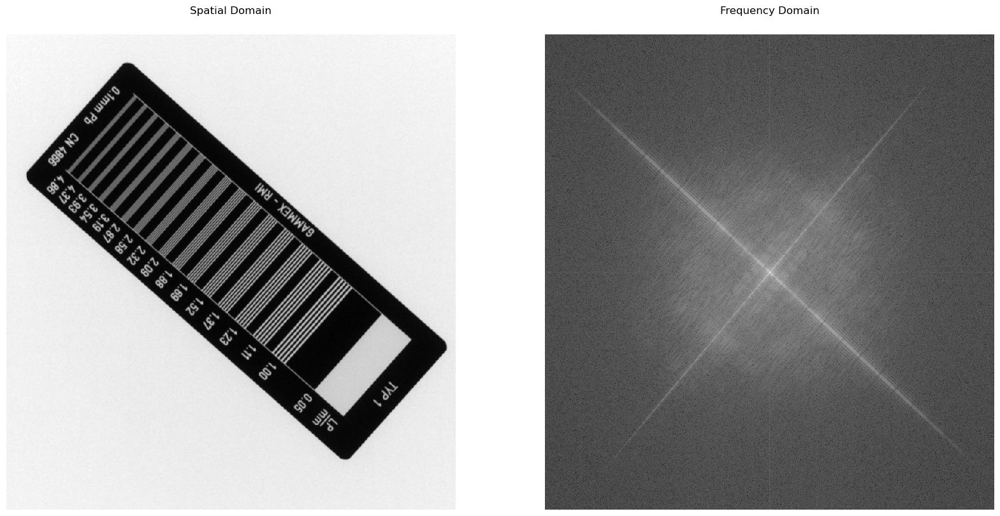

In [20]:
# define functions to do FT and inverse FT with numpy fft class
def get_2dft(image):
    '''The standard Fourier Transform
        using fast FT methods. Maps 
        spatial to frequency'''
    #ft = np.fft.ifftshift(image)
    ft = np.fft.fft2(image)
    return np.fft.fftshift(ft)

def get_i2dft(ft):
    '''The standard Inverse Fourier 
        Transform using fast FT methods. 
        Maps frequency to spatial'''
    image = np.fft.ifftshift(ft)
    image = np.fft.ifft2(image)
    return image

# load, crop and flip image 14
pixels = get_pixels(14, ROOT, img_list)
pixels = np.fliplr(pixels[600:1500,600:1450])

# do FT
ft = get_2dft(pixels)

# plot
plt.set_cmap("gray")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))
ax1.matshow(pixels)
ax1.set_title('Spatial Domain')
ax1.set_axis_off()
ax2.matshow(np.log(abs(ft))) # need to take only the real part of the FT and the log to plot!
ax2.set_title('Frequency Domain')
ax2.set_axis_off()

**Inverse Fourier Transform Example**
- The iFT **maps k-space images back to the spatial domain** retaining all original image information!
- In math jargon, this is called a "bijective" transformation - everything in the spatial domain maps to the frequency domain and vice versa
- It is important to realize we are not mapping points to points - we are mapping information displayed on a spatial set of points to the same information but displayed on a frequency set of points
- This is useful because this means we can move the image to k-space via the FT, opperate on it there, then use the iFT to get back to the spatial domain with an altered image!
- First, let's just look at how the FT and iFT work without altering anything in k-space:

<Figure size 640x480 with 0 Axes>

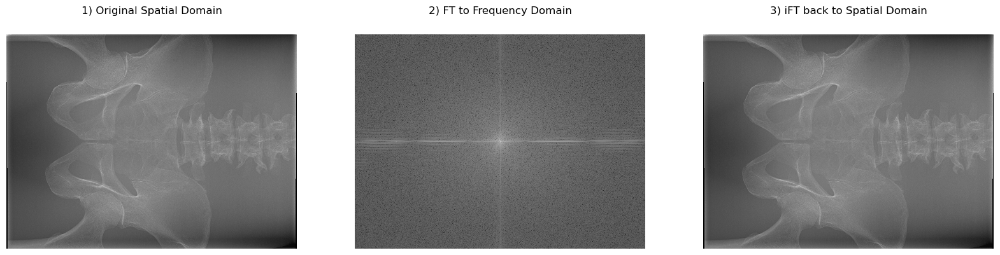

In [21]:
# load image 1
pixels = get_pixels(1, ROOT, img_list)

# do FT
ft = get_2dft(pixels)

# do iFT
ift = get_i2dft(ft)

# plot
plt.set_cmap("gray")
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 20))
ax1.matshow(pixels)
ax1.set_title('1) Original Spatial Domain')
ax1.set_axis_off()
ax2.matshow(np.log(abs(ft))) # need to take only the real part of the FT and the log to plot!
ax2.set_title('2) FT to Frequency Domain')
ax2.set_axis_off()
ax3.matshow((abs(ift))) # need to take only the real part of the FT and the log to plot!
ax3.set_title('3) iFT back to Spatial Domain')
ax3.set_axis_off()

- We see here exactly what is described in the FT and iFT math
- 1 to 2 shows the mapping of the original image to k-space
- 2 to 3 shows the mapping of the k-space image back to the spatial domain
- 1 and 2 is the exact same image, after enduring the journey to k-space and back via the FT and iFT!

#### Masking in the Frequency Domain

- What happens when we start to mess with the image in k-space?
- Opperating on the image in k-space leads to very special outcomes in the spatial domain
- A 2D mask in programming terms is a matrix that opperates on another matrix of the same size through **multiplication**
- **Multiplying a mask with an image in k-space achieves the same result as convolution with a kernel and an image in the spatial domain!**
- This is the heart of the **convolution-multiplication theorem** 
- Let's try a simple masking function that sets all low-frequency k-space points to zero (high pass filter):
#### Masking Low Frequencies (High Pass Filter)

/var/folders/wm/m5znc76d365d_16vvb85vzcr0000gn/T/ipykernel_81039/4089728134.py:27: RuntimeWarning: divide by zero encountered in log
  ax2.matshow(np.log(abs(masked))) # need to take only the real part of the FT and the log to plot!


<Figure size 640x480 with 0 Axes>

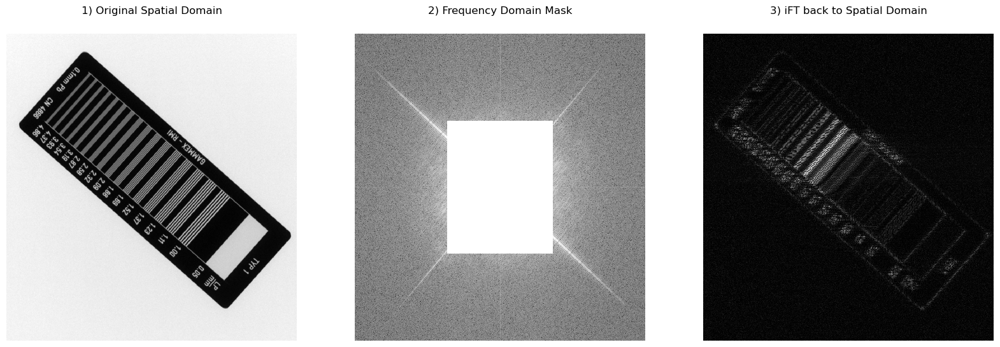

In [22]:
# load, crop and flip image 14
pixels = get_pixels(14, ROOT, img_list)
pixels = np.fliplr(pixels[600:1500,600:1450])

# do FT
ft = get_2dft(pixels)

# define a mask of 1's and 0's 
mask = np.ones(ft.shape) # create a mask with the image's shape
bw = 0.3 # choose border width and height as fraction of image size
bx = int(ft.shape[1] * bw) # get the x dimension border width
by = int(ft.shape[0] * bw) # get the y dimension border height
mask[bx:-bx,by:-by] = 0 # create a mask with 1 for border and 0 for inside

# mask the FT
masked = ft * mask 

# do iFT
ift = get_i2dft(masked)

# plot
plt.set_cmap("gray")
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 20))
ax1.matshow(pixels)
ax1.set_title('1) Original Spatial Domain')
ax1.set_axis_off()
ax2.matshow(np.log(abs(masked))) # need to take only the real part of the FT and the log to plot!
ax2.set_title('2) Frequency Domain Mask')
ax2.set_axis_off()
ax3.matshow((abs(ift))) # need to take only the real part of the FT and the log to plot!
ax3.set_title('3) iFT back to Spatial Domain')
ax3.set_axis_off()

- This mask removes the **low frequency k-space values** from the image
- Similar to our high pass sharpening convolution kernel shown in Section 6B, the result is a very sharp version of the original image
- We can adjust the level of sharpness by making our mask cover more or less of the **center** of k-space
- Because low frequency 2D sinusoids are the building blocks of images, we tend to loose a lot of information about an image using this mask
- Let's invert this mask to remove only high frequency k-space values:
#### Masking High Frequencies (Low Pass Filter)

/var/folders/wm/m5znc76d365d_16vvb85vzcr0000gn/T/ipykernel_81039/28237542.py:28: RuntimeWarning: divide by zero encountered in log
  ax2.matshow(np.log(abs(masked))) # need to take only the real part of the FT and the log to plot!


<Figure size 640x480 with 0 Axes>

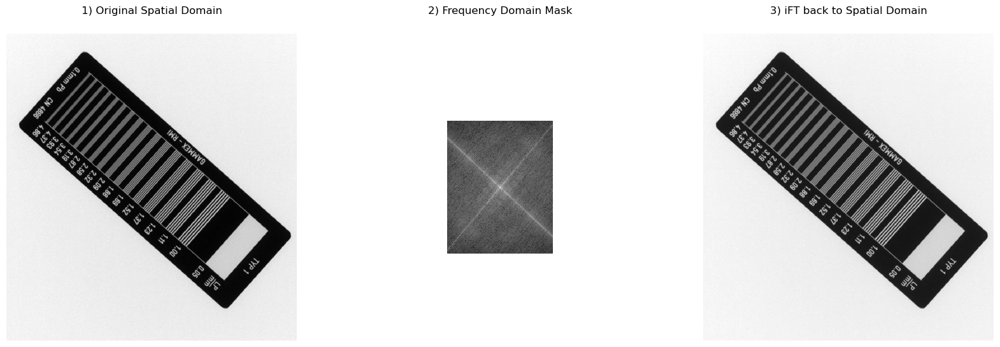

In [23]:
# original low frequency mask
mask = np.ones(ft.shape) # create a mask with the image's shape
bw = 0.3 # choose border width and height as fraction of image size
bx = int(ft.shape[1] * bw) # get the x dimension border width
by = int(ft.shape[0] * bw) # get the y dimension border height
mask[bx:-bx,by:-by] = 0 # create a mask with 1 for border and 0 for inside

# new high frequency mask 
# very quick and dirty coding - just switch all 0 and 1 :')
where_0 = np.where(mask == 0)
where_1 = np.where(mask == 1)
# invert the mask
mask[where_0] = 1
mask[where_1] = 0

# mask the FT
masked = ft * mask 

# do iFT
ift = get_i2dft(masked)

# plot
plt.set_cmap("gray")
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 20))
ax1.matshow(pixels)
ax1.set_title('1) Original Spatial Domain')
ax1.set_axis_off()
ax2.matshow(np.log(abs(masked))) # need to take only the real part of the FT and the log to plot!
ax2.set_title('2) Frequency Domain Mask')
ax2.set_axis_off()
ax3.matshow((abs(ift))) # need to take only the real part of the FT and the log to plot!
ax3.set_title('3) iFT back to Spatial Domain')
ax3.set_axis_off()

- This mask removes the **high frequency k-space values** from the image
- Similar to our gaussian convolution kernel shown in Section 6A, the result is a blurred version of the original image
- We can adjust the level of blur by making our mask cover more or less of the **edges** of k-space
- We readily see that this low pass filter does not impact the spatial domain representation as much as high pass filtering did
- This is because high frequency 2D sinusoids correspond to edge or detail information in an image, not its fundimental information like low frequency 2D sinusoids
- These two examples show that **we can achieve the same results as convolution in the spatial domain via simple multiplication in the frequency domain**

## Summary

**In this very lengthy tutorial we have learned:**
1. How images are mathematically expressed as 2D matricies and how to handel them using various python packages
2. How to read and crop DICOM datasets and extract useful aquisition parameters from them
3. How convolution can be used to filter images in the spatial domain
4. How to define different types of convolution kernels for different filtering goals
5. How to compute a convolution using SciPy 
6. How the discrete 2D Fourier Transform and its inverse can be used to map images from the spatial domain to the frequency domain (k-space) and vice versa
7. How to define k-space masks to filter images in the frequency domain through multiplication
8. How to compute a FT and iFT using NumPy
9. How mask multiplication in the frequency domain can achieve the same result as kernel convolution in the spatial domain
10. How image processing uses a unique combination of mathematic analysis tools to acheive high quality images capable of informing clinical decisions :)

If you made it to the end, you're a real one! Please address and questions, comments, or corrections to arenne@uchicago.edu <3